# Datenanalyse

In [1]:
import pickle

import numpy as np
import pandas as pd
import seaborn as sns

import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid

### Daten laden

In [2]:
# Daten laden und aufteilen in Features und Labels
with open('../data/train.pkl', 'rb') as f:
    data_train = pickle.load(f)
X_data = data_train["images"]
y_data = data_train["labels"]

Als erstes überprüfen wir den `type` und die `shape` der Daten.

In [3]:
print(type(X_data), X_data.shape)
print(type(y_data), y_data.shape)

<class 'numpy.ndarray'> (50000, 32, 32, 3)
<class 'numpy.ndarray'> (50000,)


Wir sehen, dass es sich um einen `numpy` array handelt. 
Das `Data Set` besteht aus 50'000 Bildern und jedes Bild besteht aus 32x32 Pixeln mit 3 Kanälen für die Farben (RGB, **R**ot **G**rün **B**lau).
Viele Modelle (wie die `Logistic Regression`) erwarten die Daten aber als 2D-Matrix, wobei jede Zeile ein Datenpunkt (hier ein Bild) ist und jede Spalte ein Feature (hier Pixel-Farbkanal-Intensität).
Dies können wir mit der `reshape` Funktion von `numpy` erreichen.
Dafür ordnen wir die Pixel-Farbkanal-Intensität nicht mehr dreidimensional in Pixel und Farbkanal an, sondern eindimensional in einen einzelnen Vektor.

![image.png](img/reshape.png)

In [11]:
# 4-dimensionale Repräsentation verwandeln in 2-dimensionale Repräsentation wie im Bild oben dargestellt.  
X_data_2d = X_data.reshape((-1, 32 * 32 * 3))

pd.DataFrame(X_data_2d).describe()

,0,1,2,3,4,5,6,7,8,9,...,3062,3063,3064,3065,3066,3067,3068,3069,3070,3071
count,50000.000000,50000.00000,50000.000000,50000.00000,50000.000000,50000.000000,50000.000000,50000.00000,50000.000000,50000.000000,...,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000
mean,130.710740,136.05614,132.553800,130.14036,135.442380,131.853580,131.050440,136.24616,132.581440,131.568860,...,113.877800,126.778360,125.697080,113.830580,126.564960,125.617420,113.906240,126.639080,125.850300,114.381860
std,73.412873,72.90798,80.449751,72.44259,71.901316,79.598048,72.240546,71.67471,79.434675,72.016555,...,64.738943,63.954763,61.591233,64.894603,64.178427,61.831646,65.212671,64.926283,62.649286,66.077526
min,0.000000,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,71.000000,77.00000,61.000000,71.00000,78.000000,61.000000,73.000000,79.00000,62.000000,73.000000,...,64.000000,79.000000,81.000000,64.000000,79.000000,81.000000,64.000000,78.000000,80.000000,63.000000
50%,128.000000,135.00000,127.000000,127.00000,135.000000,127.000000,129.000000,136.00000,128.000000,130.000000,...,106.000000,124.000000,123.000000,106.000000,124.000000,123.000000,106.000000,124.000000,123.000000,106.000000
75%,189.000000,195.00000,207.000000,188.00000,193.000000,206.000000,188.000000,194.00000,206.000000,188.000000,...,157.000000,172.000000,167.000000,157.000000,172.000000,167.000000,157.000000,172.000000,168.000000,158.000000
max,255.000000,255.00000,255.000000,255.00000,255.000000,255.000000,255.000000,255.00000,255.000000,255.000000,...,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000


### Anzeigen einer Auswahl von Bildern

Wir wählen **zufällig 100 Bilder** aus und zeigen sie mit den dazugehörenden Labels an.

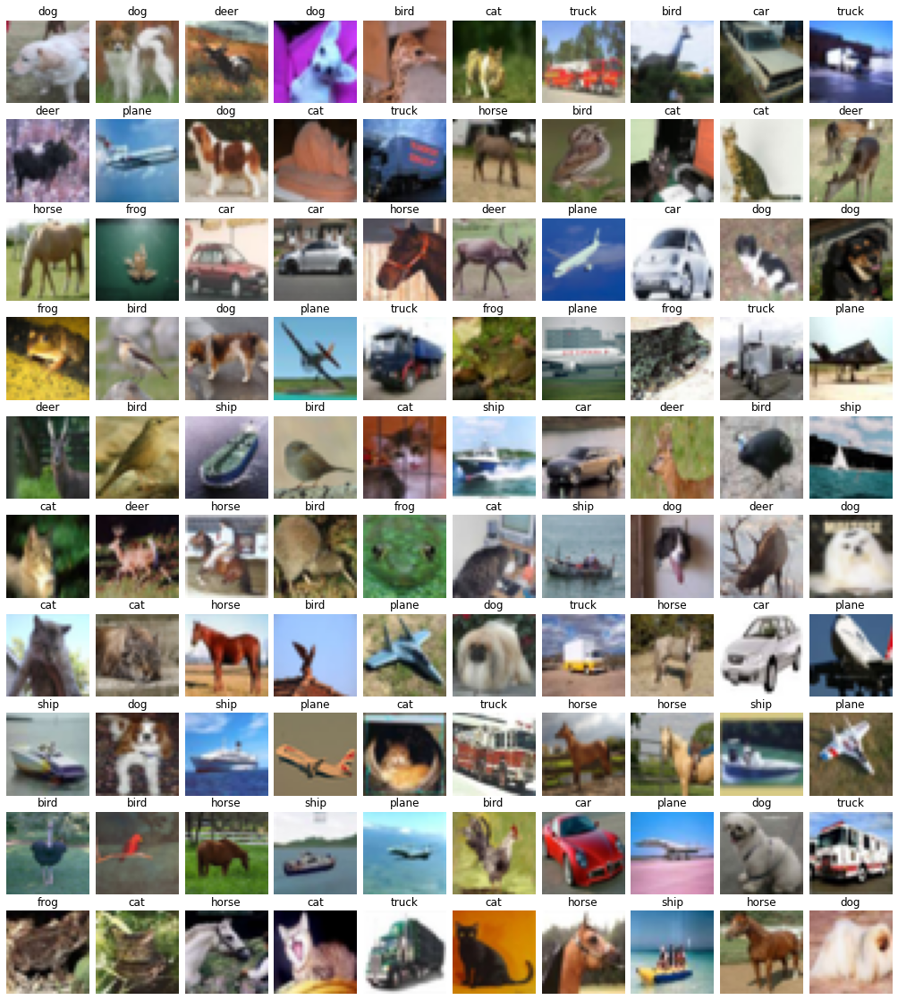

In [5]:
fig = plt.figure(figsize=(20., 20.))

grid = ImageGrid(fig, 111,
    nrows_ncols=(10, 10),
    axes_pad=(0.1, 0.25),
)

idx = np.arange(y_data.size)
np.random.shuffle(idx)

for ax, im, label in zip(grid, X_data[idx], y_data[idx]):
    ax.set_title(label)
    ax.axis('off')
    ax.imshow(im)

plt.show()

Um die einzelnen Klassen noch etwas besser zu verstehen, wählen wir **pro Klasse 100 Bilder** aus um sie anzuzeigen.

/var/folders/q6/w0x51kqj1g11s30hfh0x8ycc0000gn/T/ipykernel_40847/36899698.py:20: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


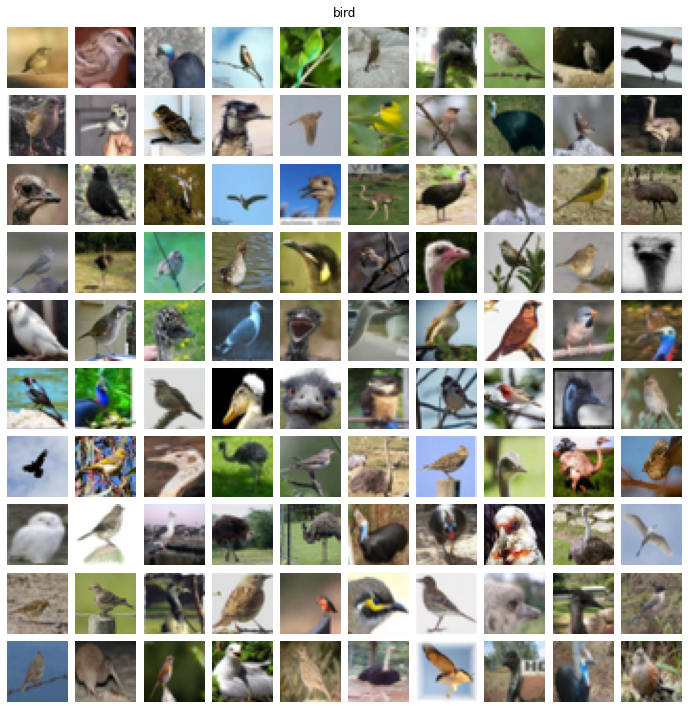

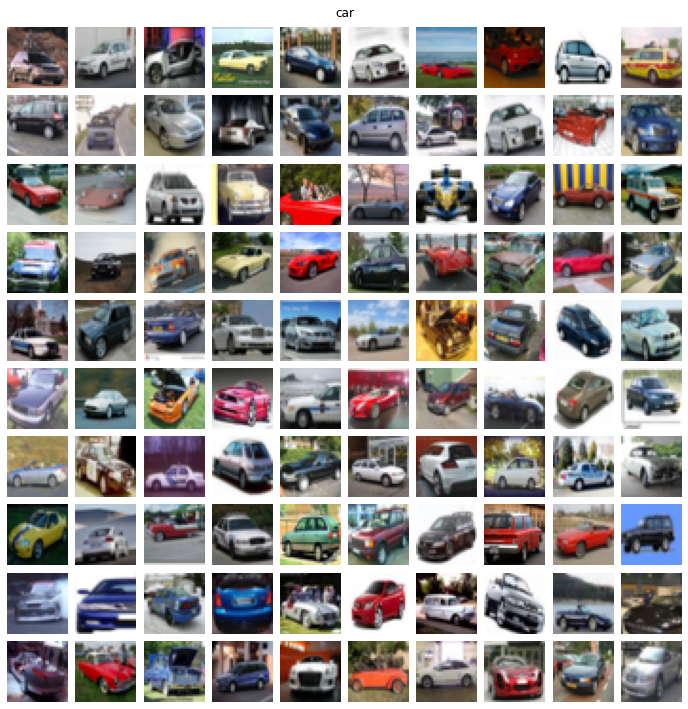

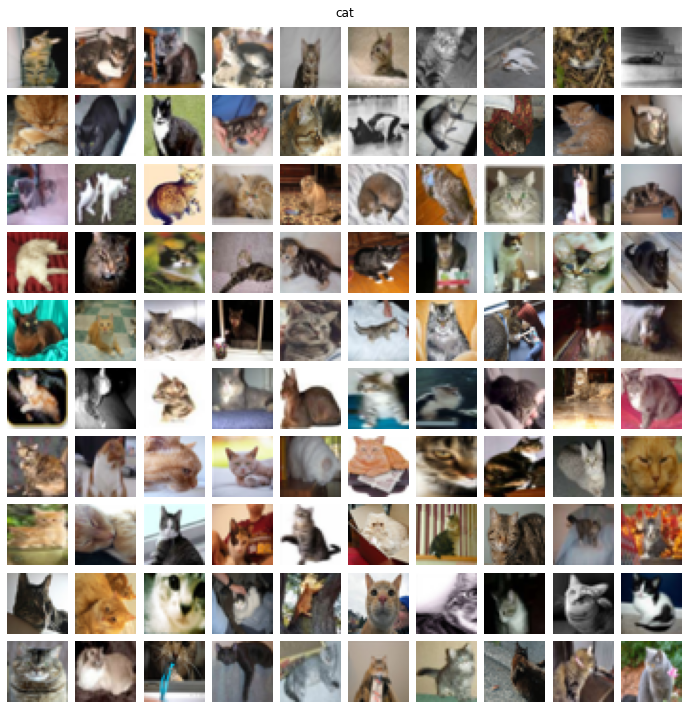

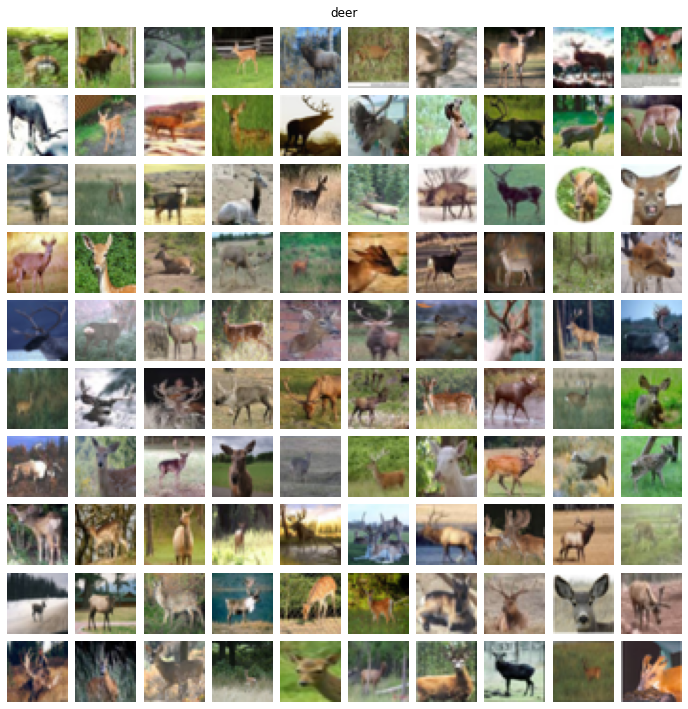

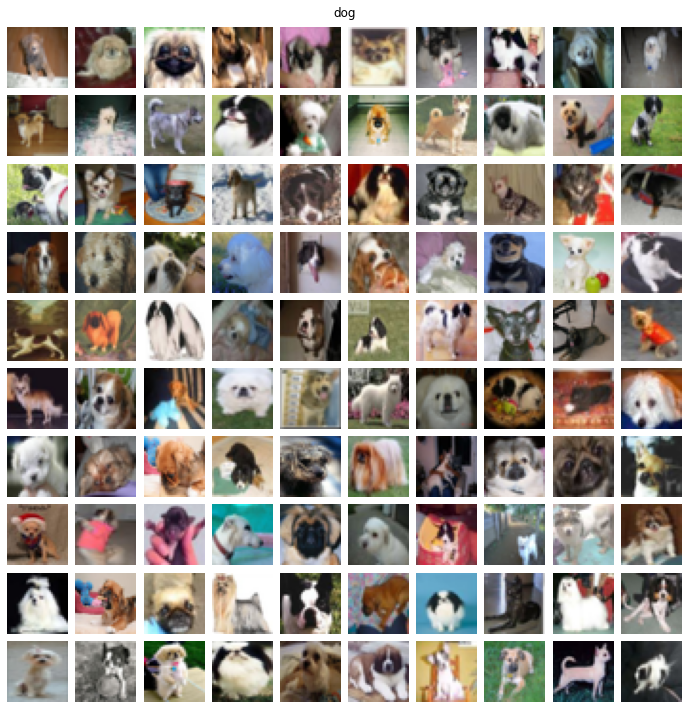

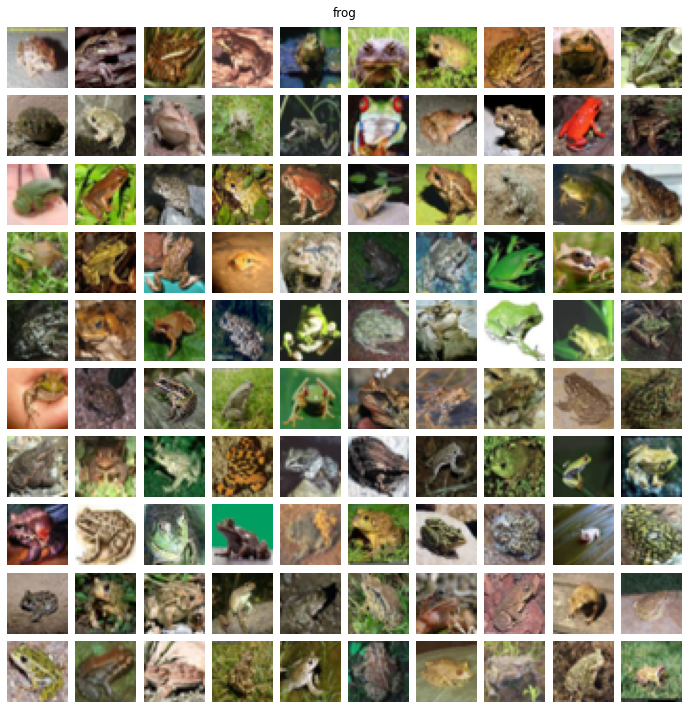

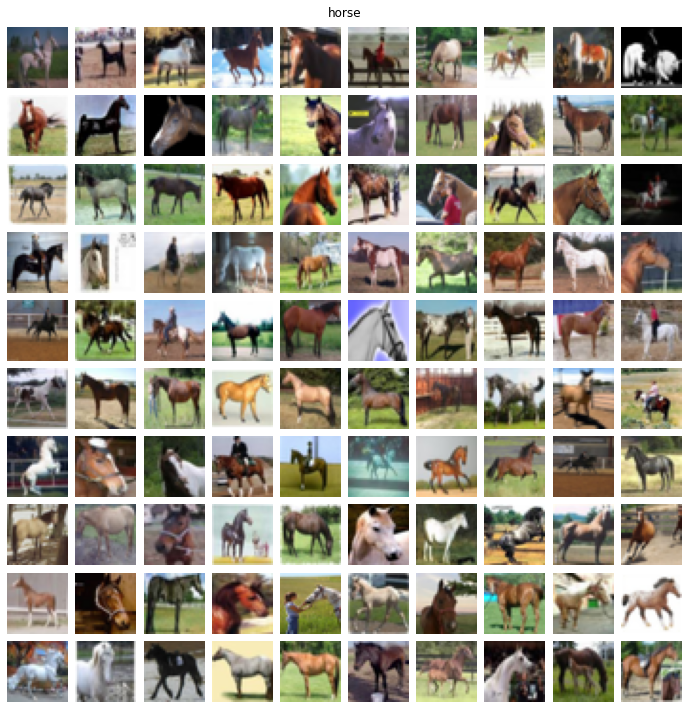

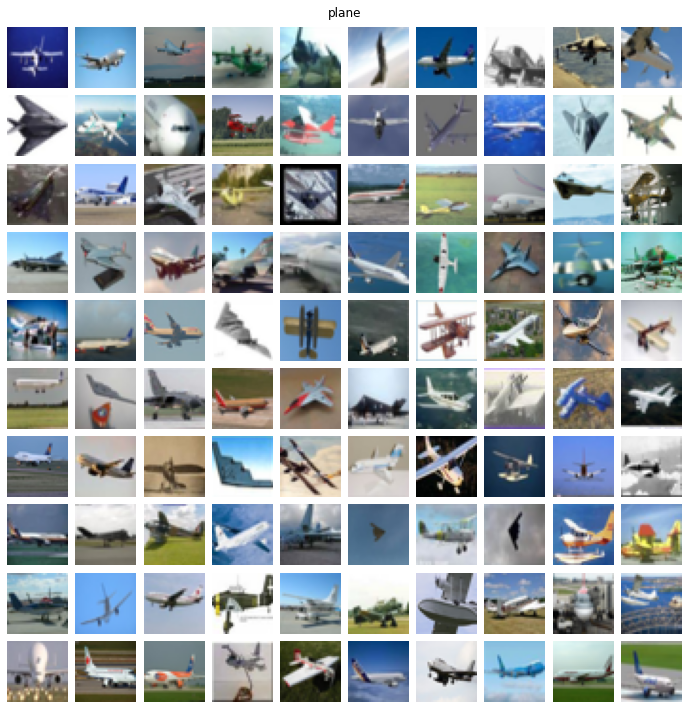

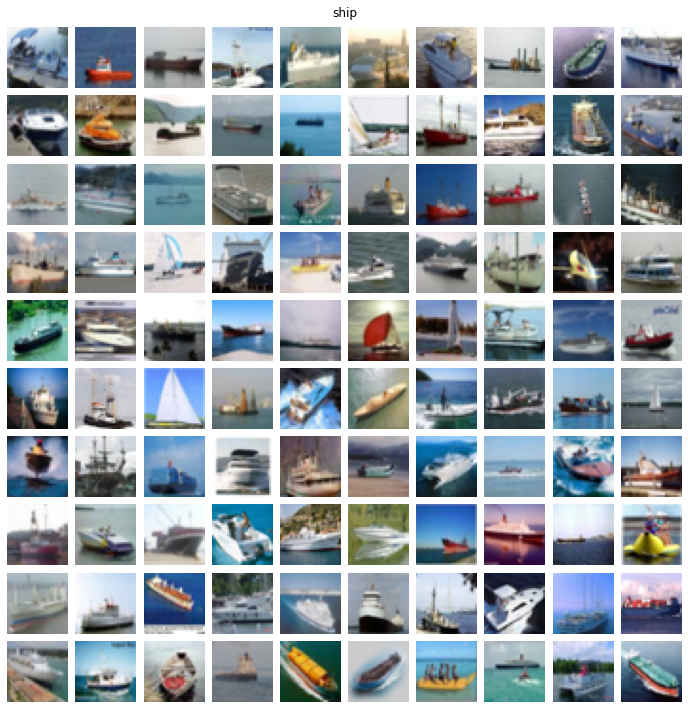

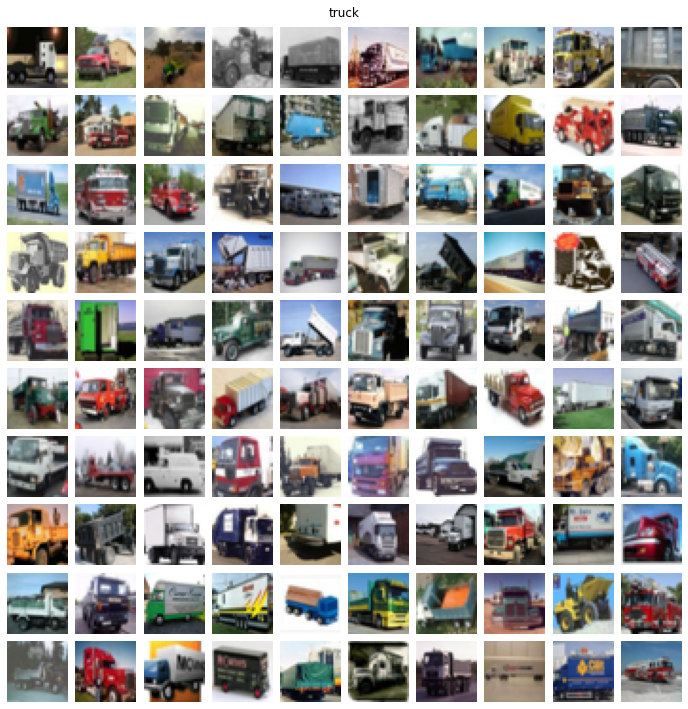

In [6]:
for category in np.unique(y_data):
    fig = plt.figure(figsize=(10., 10.))

    grid = ImageGrid(fig, 111,
        nrows_ncols=(10, 10),
        axes_pad=(0.1, 0.1),
    )
    fig.suptitle(category)

    X_data_cat = X_data[y_data == category, :, :, :]
    y_data_cat = y_data[y_data == category]

    idx = np.arange(y_data_cat.size)
    np.random.shuffle(idx)

    for ax, im, label in zip(grid, X_data_cat[idx], y_data_cat[idx]):
        ax.axis('off')
        ax.imshow(im)

    plt.tight_layout()
    plt.show()

Ein paar Aspekte, welche auf den ersten Blick auffallen:
* Die `birds` sind eher am Boden und nicht in der Luft abgebildet.
* Die `planes` hingegen meistens in der Luft.
* Bei den `trucks` sind viele Feuerwehrautos vertreten.
* Bei den `cars` sind einige Autos auf völlig weissem Hintergrund dargestellt.

### Balancierung der Klassen

Die Balancierung der Klassen ist ein wichtiger Aspekt für die Klassifikation. Mit `sns.countplot` können wir die Verteilung der Klassen anzeigen und verifizieren, dass sie ausgeglichen sind (wie in der Beschreibung von CIFAR-10 behauptet).

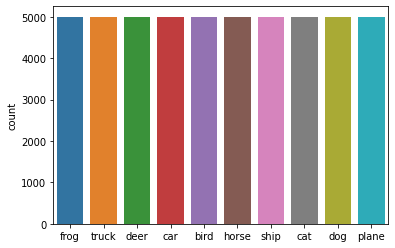

In [7]:
sns.countplot(x=y_data)
plt.show()

### Farbanalyse der Klassen

Wir schauen uns nun die **Farbkanäle der einzelnen Klassen** etwas genauer an. Dazu berechnen wir die Durchschnittwerte der einzelnen Farbkanäle und auch aller Kanäle zusammen für jede Klasse. Diese plotten wir in einem Balkendiagramm.

In [8]:
color_stats = []
for category in np.unique(y_data):
    color_stats.append({
        'category': category,
        'color': 'all',
        'mean intensity': X_data[y_data == category,:,:,:].mean(),
    })
    for i, color in enumerate(['red','green','blue']):
        color_stats.append({
            'category': category,
            'color': color,
            'mean intensity': X_data[y_data == category,:,:,i].mean(),
        })
color_stats_df = pd.DataFrame(color_stats)

In [9]:
color_stats_df.head()

,category,color,mean intensity
0,bird,all,119.405596
1,bird,red,124.758728
2,bird,green,125.326642
3,bird,blue,108.131419
4,car,all,116.697537


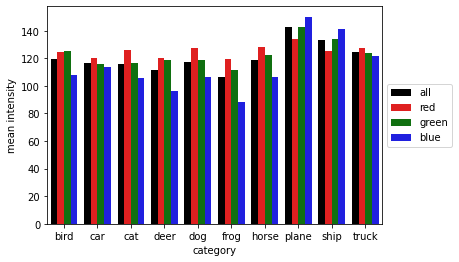

In [10]:
g = sns.barplot(
    data=color_stats_df, 
    x="category", 
    y='mean intensity', 
    hue='color', 
    palette={
        'all': 'black', 
        'red': 'red', 
        'blue': 'blue', 
        'green': 
        'green'
    }
)
g.legend(loc='center left', bbox_to_anchor=(1, 0.5))

Das Einzige, das hier speziell auffällt, ist, dass wie erwartet bei den Flugzeugen und Schiffen der Blau-Kanal eine deutlich höhere durchschnittliche Intensität aufweist als in den anderen Klassen.

## Nächste Schritte

Als Nächstes werden wir eine `Baseline` erstellen mittels `Logistic Regression`.
Dazu müssen wir die Daten mittels `reshape` in einen zweidimensionalen Vektor transformieren und anschliessend einer `Logistic Regression` übergeben.